In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [1]:
import numpy as np
import pandas as pd

import time

import warnings
warnings.filterwarnings("ignore")

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import tensorflow as tf

import os
from PIL import Image
import tensorflow_io as tfio

2024-08-18 09:32:51.431703: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-18 09:32:51.431909: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-18 09:32:51.613214: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [ ]:
dftrain = pd.read_csv("/kaggle/input/gravity-spy-gravitational-waves/trainingset_v1d1_metadata.csv")

In [ ]:
dftrain.label.value_counts()

In [ ]:
tf_train = tf.keras.preprocessing.image_dataset_from_directory('/kaggle/input/gravity-spy-gravitational-waves/train/train',
                                                              labels = 'inferred',
                                                              label_mode = None,
                                                               color_mode ='grayscale',
                                                              batch_size = None,
                                                              image_size=(479,479),
                                                              shuffle = False,
                                                              seed = 33,
                                                              follow_links = True,
                                                              crop_to_aspect_ratio = True
                                                              )
tf_train

In [ ]:
tf_validation = tf.keras.preprocessing.image_dataset_from_directory("/kaggle/input/gravity-spy-gravitational-waves/validation/validation",
                                                                   batch_size = None,
                                                                   labels = "inferred",
                                                                   label_mode = None,
                                                                    color_mode ='grayscale',
                                                                    image_size=(479,479),
                                                                   shuffle = False,
                                                                   
                                                                    crop_to_aspect_ratio = True
                                                                   )
                                                                    
tf_validation

In [ ]:
tf_test = tf.keras.preprocessing.image_dataset_from_directory('/kaggle/input/gravity-spy-gravitational-waves/test/test',
                                                             labels = 'inferred',
                                                             label_mode = None,
                                                             color_mode ='grayscale',
                                                             batch_size = None,
                                                             image_size=(479,479),
                                                             shuffle = False,
                                                             crop_to_aspect_ratio = True
                                                              
                                                             )
tf_test

In [ ]:
list_train_image = tf.data.Dataset.list_files('/kaggle/input/gravity-spy-gravitational-waves/train/train/*/*',shuffle=False, seed=33)


for f in list_train_image.take(32):
  print(f.numpy())

In [ ]:
for image_batch in list_train_image:
        image = image_batch[0]  # Get image tensor
        file_path = image_batch[1].numpy()[0].decode('utf-8')  # Get the file path
        
        # Determine subclass from file path
        parts = file_path.split('/')
        subclass = parts[-1] 
        print(subclass)

# IMP Functions start from here...

In [2]:
def process_class(file_path):
    
    return tf.strings.split(file_path, os.sep)[-2]


In [3]:
def process_subclass_name(file_path):
    
    return tf.strings.split(file_path, os.sep)[-1]

In [4]:
def process_image(file_path):
    label = process_class(file_path)
    
    img1 = tf.io.read_file(file_path)
    
    img2 = tf.image.decode_png(img1)
    
    #img3 = tf.image.resize(img,[256,256])
    
    return img2,label

In [5]:
def load_image(image_path):
    """ Load an image from file and return a TensorFlow tensor. """
    img = tf.io.read_file(image_path)
    img = tf.image.decode_png(img, channels=4)  # Adjust channels if necessary

    # Convert to grayscale
    #img = tfio.experimental.color.rgba_to_rgb(image) 
    #img = tf.image.rgb_to_grayscale(image[..., :3])  # Drop alpha channel and convert to grayscale
    img = tf.image.convert_image_dtype(img, tf.float32)  # Normalize to [0, 1]
    return img

    

In [6]:
#for grayscale images
def load_image_concatenated(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=3)
    #img = tf.image.rgb_to_grayscale(image)
    #image = tf.image.resize(image, target_size)
    #image = tf.cast(image, tf.float32) / 255.0  # Normalize to [0, 1]
    return img


In [7]:
# for rgba images
# target_size=(479, 479)
import tensorflow_io as tfio

def load_and_preprocess_image(image_path,target_size):
    """Load and preprocess an image from a file path."""
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=4)  # Load as RGBA
    image = tf.image.resize(image, target_size)
    # Convert to grayscale
    image = tfio.experimental.color.rgba_to_rgb(image) 
    image = tf.image.rgb_to_grayscale(image[..., :3])  # Drop alpha channel and convert to grayscale
    image = tf.cast(image, tf.float32) / 255.0  # Normalize to [0, 1]
    return image

In [ ]:
'''
image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=4)  # Load as RGBA
    #image = tf.image.resize(image, target_size)
    # Convert to grayscale
    image = tfio.experimental.color.rgba_to_rgb(image) 
    image = tf.image.rgb_to_grayscale(image[..., :3])  # Drop alpha channel and convert to grayscale
    image = tf.cast(image, tf.float32) / 255.0  # Normalize to [0, 1]
    return image
'''

In [8]:
def process_image2(file_path):
    #label = process_class(file_path)
    
    img1 = tf.io.read_file(file_path)
    
    img2 = tf.image.decode_png(img1)
    
    #img3 = tf.image.resize(img,[256,256])
    
    return img2

In [9]:
'''
def concatenate_images(image_tensors, orientation='horizontal'):
    """ Concatenate a list of TensorFlow image tensors into one tensor. """
    #resized_images = [resize_image(img, [479, 479]) for img in image_tensors]  # Resize to fixed dimensions
    
    if orientation == 'horizontal':
        concatenated_image = tf.concat(resized_images, axis=1)  # Concatenate horizontally
    else:
        concatenated_image = tf.concat(resized_images, axis=0)  # Concatenate vertically
    
    return concatenated_image
'''

def concatenate_images(images, orientation='horizontal'):
    """Concatenate a list of images into one image."""
    if len(images) == 0:
        return None
    
    #resized_images = [tf.image.resize(img, [479, 479]) for img in images]  # Resize all images to the same size

    if orientation == 'horizontal':
        concatenated_image = tf.concat(images, axis=1)
    elif orientation == 'vertical':
        concatenated_image = tf.concat(images, axis=0)
    else:
        raise ValueError("Orientation must be 'horizontal' or 'vertical'")

    return concatenated_image


In [10]:
#Save a Tensorflow tensor as an image file:

def save_image(tensor, save_path):
    image = tf.image.grayscale_to_rgb(tensor)
    image_array = image.numpy()
    image_array = (image_array * 255).astype(np.uint8)
    image_encoded = tf.image.encode_png(image_array)
    tf.io.write_file(save_path, image_encoded)
    
    
'''

def save_image_tf(image_tensor, file_path):
    # Convert tensor to uint8 format if needed
    image_tensor = tf.cast(image_tensor, tf.uint8)
    
    # Ensure the image tensor has the correct shape for saving
    if image_tensor.shape[-1] != 1:
        raise ValueError("Image tensor must have a single channel.")
    
    # Remove the single channel dimension
    #image_tensor = tf.squeeze(image_tensor, axis=-1)
    
    # Encode the image as PNG
    #image_encoded = tf.image.encode_png(image_tensor)
    
    # Write the image to the file
    tf.io.write_file(file_path, image_tensor)
'''

'\n\ndef save_image_tf(image_tensor, file_path):\n    # Convert tensor to uint8 format if needed\n    image_tensor = tf.cast(image_tensor, tf.uint8)\n    \n    # Ensure the image tensor has the correct shape for saving\n    if image_tensor.shape[-1] != 1:\n        raise ValueError("Image tensor must have a single channel.")\n    \n    # Remove the single channel dimension\n    #image_tensor = tf.squeeze(image_tensor, axis=-1)\n    \n    # Encode the image as PNG\n    #image_encoded = tf.image.encode_png(image_tensor)\n    \n    # Write the image to the file\n    tf.io.write_file(file_path, image_tensor)\n'

In [ ]:
#Define the new path
new_directory_path = '/kaggle/working/Train_images'

#Creating the new directory if it doesn;t exist;

os.makedirs(new_directory_path,mode = 0o777,exist_ok = True)


In [ ]:
#Define the new path
new_directory_path_train1 = '/kaggle/working/Concat_train_images'

#Creating the new directory if it doesn;t exist;

os.makedirs(new_directory_path_train1,mode = 0o777,exist_ok = True)

In [11]:
#This directory used for new concatenated train images...
#Define the new path
new_directory_path_train = '/kaggle/working/Concat_Train_images'

#Creating the new directory if it doesn;t exist;

os.makedirs(new_directory_path_train,mode = 0o777,exist_ok = True)

In [13]:

#Define the new path
new_directory_path_valid1 = '/kaggle/working/Concat_valid_images'

#Creating the new directory if it doesn;t exist;

os.makedirs(new_directory_path_valid1,mode = 0o777,exist_ok = True)

In [12]:
#This directory used for new concatenated validation images...

#Define the new path

new_directory_path_valid = '/kaggle/working/Concat_Valid_images'

#Creating the new directory if it doesn;t exist;

os.makedirs(new_directory_path_valid,mode = 0o777,exist_ok = True)

In [ ]:
#Define the new path
new_directory_path_test1 = '/kaggle/working/Concat_test_images'

#Creating the new directory if it doesn;t exist;

os.makedirs(new_directory_path_test1,mode = 0o777,exist_ok = True)

In [13]:
#This directory used for new concatenated test images...

#Define the new path
new_directory_path_test = '/kaggle/working/Concat_Test_images'

#Creating the new directory if it doesn;t exist;

os.makedirs(new_directory_path_test,mode = 0o777,exist_ok = True)

In [ ]:
# Avoid OOM errors by setting GPU Memory Consumption Growth
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus: 
    tf.config.experimental.set_memory_growth(gpu, True)

In [ ]:
tf.config.list_physical_devices('GPU')

# Method 1

# for Train images

In [14]:
#process dataset to concatenate images within each subclass...
def ultimate_process(dataset_path,path):
    link1 = os.listdir(dataset_path)
    link1.sort()
#print(link1_new)
    subclass_images={}
    concat_images_list = {}
    for class_name in link1:
        class_ = class_name
        class_path = os.path.join(dataset_path,class_name)
        
        if os.path.isdir(class_path):
            link2 = os.listdir(class_path)
            link2.sort()
            for subclass_name in link2:
                subclass_ = subclass_name
                subclass_path = os.path.join(class_path, subclass_)
                base_name = os.path.basename(subclass_path)  # Extracts 'H1_08UZkPPyFQ_spectrogram_0.5.png'
                desired_part = base_name.split('.png')[0]

                subclass_images[desired_part]=load_and_preprocess_image(subclass_path,(256,256))

                #print(len(subclass_images))

                # Concatenate and save images
                #for subclass, images in subclass_images.items():
                if len(subclass_images)==4:

                    image1, image2,image3,image4 = subclass_images.values()
                    key1, key2, key3,key4 = subclass_images.keys()
                    
                    # Concatenate images
                    concatenated_image = concatenate_images([image1,image2,image3,image4], orientation='horizontal')
                    
                    print(key1)
                    print('\n')
                    subclass_images.clear()
                    
                    print(concatenated_image.shape)
                    print('\n')
                    concat_images_list[class_+key1] = concatenated_image
                    
                    #Saving the final images...
                    
                    save_path = os.path.join(path, f'{class_}/{subclass_}_concatenated.png')
                        #tf.io.write_file(save_path, concatenated_images.numpy())
                    save_image(concatenated_image,save_path)
                            #save_path = os.path.join(subclass_path, f'{subclass_path}_concatenated_image.png')
                            #save_image(concatenated_images, save_path)
                    print(f"Saved concatenated image for {class_}{subclass_} at {save_path}")

    return concat_images_list 

In [ ]:
dataset_path = '/kaggle/input/gravity-spy-gravitational-waves/train/train'
link1 = os.listdir(dataset_path)
link1.sort()
#print(link1_new)
subclass_images={}
concat_images_list = {}
for class_name in link1:
    class_ = class_name
    class_path = os.path.join(dataset_path,class_name)

    if os.path.isdir(class_path):
        link2 = os.listdir(class_path)
        link2.sort()
        for subclass_name in link2:
            subclass_ = subclass_name
            subclass_path = os.path.join(class_path, subclass_)
            print(class_)
            print('\n')

In [ ]:
# practice code-successful

'''
link = '/kaggle/input/gravity-spy-gravitational-waves/train/train'
link1 = os.listdir(link)
link1.sort()
#print(link1_new)
subclass_images ={}
for class_name in link1:
    class_ = class_name
    class_path = os.path.join(link,class_)
        
    if os.path.isdir(class_path):
        link2 = os.listdir(class_path)
        link2.sort()
        for subclass_name in link2:
            subclass_ = subclass_name
            subclass_path = os.path.join(class_path, subclass_)
            #print(subclass_path)
            base_name = os.path.basename(subclass_path)  # Extracts 'H1_08UZkPPyFQ_spectrogram_0.5.png'
            desired_part = base_name.split('.png')[0]
            
            subclass_images[desired_part]=load_image(subclass_path)
            
            #print(len(subclass_images))

            # Concatenate and save images
            #for subclass, images in subclass_images.items():
            if len(subclass_images)==4:

                image1, image2,image3,image4 = subclass_images.values()
                key1, key2, key3,key4 = subclass_images.keys()
                # Concatenate images
                concatenated_image = concatenate_images([image1,image2,image3,image4])
                print(key1)
                subclass_images.clear()
                print(concatenated_image.shape)
    
#uptil here..above..correct code
    
'''
'''            subclass_images[desired_part]=load_image(subclass_path)
            print(len(subclass_images))

            # Concatenate and save images
            #for subclass, images in subclass_images.items():
            if len(subclass_images)==4:

                Total_tensors = list(subclass_images.values())
                #print(Total_tensors.shape)
                print(Total_tensors)

                        # Concatenate images
                #concatenated_image = concatenate_images(Total_tensors, orientation='horizontal')
                subclass_images.clear()
                #print(concatenated_images.shape)
                #print(concatenated_images)
'''

In [ ]:
#FOR PRActice code .....
'''
link = '/kaggle/input/gravity-spy-gravitational-waves/train/train'
link1 = os.listdir(link)
link1.sort()
#print(link1_new)

for class_name in link1:
    class_ = class_name
    class_path = os.path.join(link,class_)
        
    if os.path.isdir(class_path):
        link2 = os.listdir(class_path)
        link2.sort()
        for subclass_name in link2:
            subclass_ = subclass_name
            subclass_path = os.path.join(class_path, subclass_)
            #print(subclass_path)
            base_name = os.path.basename(subclass_path)  # Extracts 'H1_08UZkPPyFQ_spectrogram_0.5.png'
            desired_part = base_name.split('spectrogram')[0]
            
            subclass_images ={}
            subclass_images[desired_part]=load_image(subclass_path)
            
                # Concatenate and save images
            for subclass, images in subclass_images.items():
                if len(images) < 4 and len(images)>4:
                    print(f"Not enough images for subclass {subclass}")
                    continue
                elif len(images)==4:

                    Total_tensors = list(subclass_images.values())

                        # Concatenate images
                    concatenated_image = concatenate_images(Total_tensors, orientation='horizontal')
                    subclass_images.clear()
                    print(concatenated_images.shape)
                    print(concatenated_images)
            

            if len(subclass_images)<4:
                subclass_images.append(desired_part)
                if desired_part:
                #print(desired_part)
                #print(type(subclass_path))
                #if subclass_path:        
                    image_tensors = load_and_preprocess_image(subclass_path)
                       #print(image_tensors.shape)
                        #print(image_tensors)
                    concatenated_images = concatenate_images(image_tensors, orientation = 'horizontal')
            subclass_images
'''
                                                 
        

            


In [ ]:
'''
def subclass_finder(file_path):
    subclass_list =[]
    link1 = os.listdir(file_path)
    link1.sort()
    #print(link1_new)

    for class_name in link1:
        class_ = class_name
        class_path = os.path.join(link,class_)

        if os.path.isdir(class_path):
            link2 = os.listdir(class_path)
            link2.sort()
            for subclass_name in link2:
                subclass_ = subclass_name
                subclass_path = os.path.join(class_path, subclass_)
                #print(subclass_path)
                base_name = os.path.basename(subclass_path)  # Extracts 'H1_08UZkPPyFQ_spectrogram_0.5.png'
                desired_part = base_name.split('spectrogram')[0]
                subclass_list.append(desired_part)
    return subclass_list
'''

#practice

In [ ]:
#Practice code...
'''
def process_dataset(dataset_path, save_path, num_images_per_class=4):
    """Process dataset to concatenate and save images for each subclass."""
    # Use tf.data.Dataset to load images from directories
    dataset = tf.keras.preprocessing.image_dataset_from_directory(
        dataset_path,
        color_mode = 'grayscale',
        image_size=(479, 479),
        batch_size=1,  # Process one image at a time
        label_mode=None  # No labels needed
    )

#color_mode ='grayscale',

    # Dictionary to keep track of processed images per subclass
    subclass_images = {}

    for image_batch in dataset:
        image = image_batch  # Get image tensor
        #file_path = image_batch[1].numpy()[0].decode('utf-8')  # Get the file pa

        # Determine subclass from file path
        parts = subclass_finder(dataset_path)
        for i in parts:
            subclass = parts[0]  # Assuming the subclass is the second-to-last directory

        if subclass not in subclass_images:
            subclass_images[subclass] = []
  

        for i in range(0,1):
            if len(subclass_images) < num_images_per_class:
                subclass_images[i].append(image)
            else:
                len(subclass_images) > num_images_per_class
                continue
                    

        # Concatenate and save images
        for key,images in subclass_images.items():
            if len(images) < num_images_per_class and len(images)> num_images_per_cycle:
                print(f"Not enough images for subclass {subclass}")
                continue
            Image_tensors = list(subclass_images.values())
            # Concatenate images
            concatenated_image = concatenate_images(Image_tensors, orientation='horizontal')

        # Save the concatenated image
    save_file_path = os.path.join(save_path, f'_concatenated.png')
    save_image(concatenated_image, save_file_path)
    print(f"Saved concatenated image for at {save_file_path}")
    
'''

**Calling the function to get the new concatenated images....**

In [15]:
dataset_link = '/kaggle/input/gravity-spy-gravitational-waves/train/train'
new_Train_images=ultimate_process(dataset_link,new_directory_path_train)

H1_08UZkPPyFQ_spectrogram_0.5


(256, 1024, 1)


Saved concatenated image for 1080LinesH1_08UZkPPyFQ_spectrogram_4.0.png at /kaggle/working/Concat_Train_images/1080Lines/H1_08UZkPPyFQ_spectrogram_4.0.png_concatenated.png
H1_0GvkzNqHsg_spectrogram_0.5


(256, 1024, 1)


Saved concatenated image for 1080LinesH1_0GvkzNqHsg_spectrogram_4.0.png at /kaggle/working/Concat_Train_images/1080Lines/H1_0GvkzNqHsg_spectrogram_4.0.png_concatenated.png
H1_0HjYyme9E8_spectrogram_0.5


(256, 1024, 1)


Saved concatenated image for 1080LinesH1_0HjYyme9E8_spectrogram_4.0.png at /kaggle/working/Concat_Train_images/1080Lines/H1_0HjYyme9E8_spectrogram_4.0.png_concatenated.png
H1_1HqI1M9e7Y_spectrogram_0.5


(256, 1024, 1)


Saved concatenated image for 1080LinesH1_1HqI1M9e7Y_spectrogram_4.0.png at /kaggle/working/Concat_Train_images/1080Lines/H1_1HqI1M9e7Y_spectrogram_4.0.png_concatenated.png
H1_1Jpl93SqZF_spectrogram_0.5


(256, 1024, 1)


Saved concatenated image for 1080LinesH1_1Jpl93SqZF_spectrogram_4.0

In [16]:
print(len(new_Train_images))

5587


# Concatenating images of validation set

#function for valid set

In [ ]:
'''
def ultimate_process2(dataset_path):
    link1 = os.listdir(dataset_path)
    link1.sort()
#print(link1_new)
    subclass_images={}
    concat_images_list = {}
    for class_name in link1:
        class_ = class_name
        class_path = os.path.join(dataset_path,class_name)
        
        if os.path.isdir(class_path):
            link2 = os.listdir(class_path)
            link2.sort()
            for subclass_name in link2:
                subclass_ = subclass_name
                subclass_path = os.path.join(class_path, subclass_)
                base_name = os.path.basename(subclass_path)  # Extracts 'H1_08UZkPPyFQ_spectrogram_0.5.png'
                desired_part = base_name.split('.png')[0]

                subclass_images[desired_part]=load_and_preprocess_image(subclass_path,(256,256))

                #print(len(subclass_images))

                # Concatenate and save images
                #for subclass, images in subclass_images.items():
                if len(subclass_images)==4:

                    image1, image2,image3,image4 = subclass_images.values()
                    key1, key2, key3,key4 = subclass_images.keys()
                    
                    # Concatenate images
                    concatenated_image = concatenate_images([image1,image2,image3,image4], orientation='horizontal')
                    
                    print(key1)
                    print('\n')
                    subclass_images.clear()
                    
                    print(concatenated_image.shape)
                    print('\n')
                    concat_images_list[key1] = concatenated_image
                    
                    #Saving the final images...
                    
                    save_path = os.path.join(new_directory_path_valid, f'{class_}/{subclass_}_concatenated.png')
                        #tf.io.write_file(save_path, concatenated_images.numpy())
                    save_image(concatenated_image,save_path)
                            #save_path = os.path.join(subclass_path, f'{subclass_path}_concatenated_image.png')
                            #save_image(concatenated_images, save_path)
                    print(f"Saved concatenated image for {class_}{subclass_} at {save_path}")

    return concat_images_list
'''

In [17]:
dataset_link2 = '/kaggle/input/gravity-spy-gravitational-waves/validation/validation'
new_Valid_images=ultimate_process(dataset_link2,new_directory_path_valid)

H1_0BfWAn19Mr_spectrogram_0.5


(256, 1024, 1)


Saved concatenated image for 1080LinesH1_0BfWAn19Mr_spectrogram_4.0.png at /kaggle/working/Concat_Valid_images/1080Lines/H1_0BfWAn19Mr_spectrogram_4.0.png_concatenated.png
H1_1EHIj1sGu0_spectrogram_0.5


(256, 1024, 1)


Saved concatenated image for 1080LinesH1_1EHIj1sGu0_spectrogram_4.0.png at /kaggle/working/Concat_Valid_images/1080Lines/H1_1EHIj1sGu0_spectrogram_4.0.png_concatenated.png
H1_1jOUMDQOVj_spectrogram_0.5


(256, 1024, 1)


Saved concatenated image for 1080LinesH1_1jOUMDQOVj_spectrogram_4.0.png at /kaggle/working/Concat_Valid_images/1080Lines/H1_1jOUMDQOVj_spectrogram_4.0.png_concatenated.png
H1_2DYa6QC2Z8_spectrogram_0.5


(256, 1024, 1)


Saved concatenated image for 1080LinesH1_2DYa6QC2Z8_spectrogram_4.0.png at /kaggle/working/Concat_Valid_images/1080Lines/H1_2DYa6QC2Z8_spectrogram_4.0.png_concatenated.png
H1_4Yo6D5LcBL_spectrogram_0.5


(256, 1024, 1)


Saved concatenated image for 1080LinesH1_4Yo6D5LcBL_spectrogram_4.0

In [18]:
print(len(new_Valid_images))

1200


# Concatenating images of Test set

#Function for the test set

In [ ]:
'''
def ultimate_process3(dataset_path):
    link1 = os.listdir(dataset_path)
    link1.sort()
#print(link1_new)
    subclass_images={}
    concat_images_list = {}
    for class_name in link1:
        class_ = class_name
        class_path = os.path.join(dataset_path,class_name)
        
        if os.path.isdir(class_path):
            link2 = os.listdir(class_path)
            link2.sort()
            for subclass_name in link2:
                subclass_ = subclass_name
                subclass_path = os.path.join(class_path, subclass_)
                base_name = os.path.basename(subclass_path)  # Extracts 'H1_08UZkPPyFQ_spectrogram_0.5.png'
                desired_part = base_name.split('.png')[0]

                subclass_images[desired_part]=load_and_preprocess_image(subclass_path,(256,256))

                #print(len(subclass_images))

                # Concatenate and save images
                #for subclass, images in subclass_images.items():
                if len(subclass_images)==4:

                    image1, image2,image3,image4 = subclass_images.values()
                    key1, key2, key3,key4 = subclass_images.keys()
                    
                    # Concatenate images
                    concatenated_image = concatenate_images([image1,image2,image3,image4], orientation='horizontal')
                    
                    print(key1)
                    print('\n')
                    subclass_images.clear()
                    
                    print(concatenated_image.shape)
                    print('\n')
                    concat_images_list[key1] = concatenated_image
                    
                    #Saving the final images...
                    
                    save_path = os.path.join(new_directory_path_Test, f'{class_}/{subclass_}_concatenated.png')
                        #tf.io.write_file(save_path, concatenated_images.numpy())
                    save_image(concatenated_image,save_path)
                            #save_path = os.path.join(subclass_path, f'{subclass_path}_concatenated_image.png')
                            #save_image(concatenated_images, save_path)
                    print(f"Saved concatenated image for {class_}{subclass_} at {save_path}")

    return concat_images_list
'''

In [19]:
dataset_link3 = '/kaggle/input/gravity-spy-gravitational-waves/test/test'
new_Test_images=ultimate_process(dataset_link3,new_directory_path_test)

H1_2Xn58S1QCj_spectrogram_0.5


(256, 1024, 1)


Saved concatenated image for 1080LinesH1_2Xn58S1QCj_spectrogram_4.0.png at /kaggle/working/Concat_Test_images/1080Lines/H1_2Xn58S1QCj_spectrogram_4.0.png_concatenated.png
H1_2cx8vvuOAQ_spectrogram_0.5


(256, 1024, 1)


Saved concatenated image for 1080LinesH1_2cx8vvuOAQ_spectrogram_4.0.png at /kaggle/working/Concat_Test_images/1080Lines/H1_2cx8vvuOAQ_spectrogram_4.0.png_concatenated.png
H1_3FBh0droFC_spectrogram_0.5


(256, 1024, 1)


Saved concatenated image for 1080LinesH1_3FBh0droFC_spectrogram_4.0.png at /kaggle/working/Concat_Test_images/1080Lines/H1_3FBh0droFC_spectrogram_4.0.png_concatenated.png
H1_3Yp2Uixgox_spectrogram_0.5


(256, 1024, 1)


Saved concatenated image for 1080LinesH1_3Yp2Uixgox_spectrogram_4.0.png at /kaggle/working/Concat_Test_images/1080Lines/H1_3Yp2Uixgox_spectrogram_4.0.png_concatenated.png
H1_3pvAPPkVu5_spectrogram_0.5


(256, 1024, 1)


Saved concatenated image for 1080LinesH1_3pvAPPkVu5_spectrogram_4.0.png

In [ ]:
#dataset_link3 = '/kaggle/input/gravity-spy-gravitational-waves/test/test'
#new_Test_images2=ultimate_process3(dataset_link3)

In [20]:
print(len(new_Test_images))

1180


In [ ]:
#print(len(new_Test_images2))

#checking the concatenated images of each set...


# NEW TRAIN IMAGES

In [68]:
dataTr = tf.keras.preprocessing.image_dataset_from_directory('/kaggle/working/Concat_Train_images',
                                                              labels = 'inferred',
                                                              label_mode = 'int',
                                                              color_mode ='grayscale',
                                                              batch_size = 128,
                                                              image_size=(256,754),
                                                              shuffle = False,
                                                              seed=33
                                                    )

Found 5587 files belonging to 22 classes.


In [ ]:
#/kaggle/working/Concat_train_images

In [25]:
data_iterator_train = dataTr.as_numpy_iterator()

In [26]:
batch_train = data_iterator_train.next()
print(len(batch_train))

2


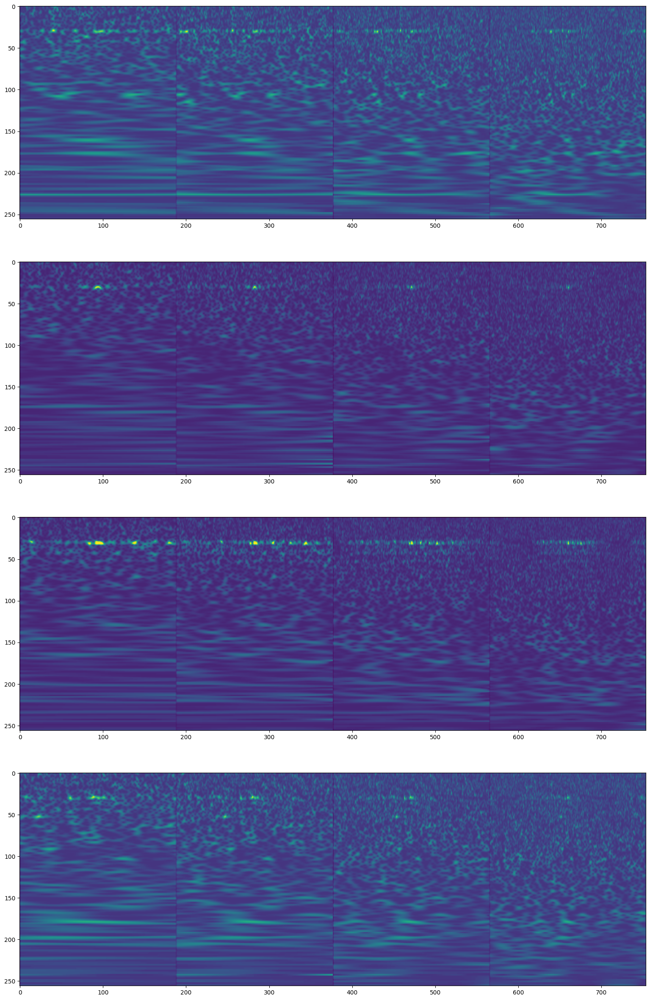

In [27]:
fig, ax = plt.subplots(nrows=4, figsize=(50,30))
for idx, img in enumerate(batch_train[0][:4]):
    ax[idx].imshow(img)
    #ax[idx].title.set_text(batch_train)

# NEW VALIDATION IMAGES...**

In [40]:
dataVa = tf.keras.preprocessing.image_dataset_from_directory('/kaggle/working/Concat_Valid_images',
                                                    labels = 'inferred',
                                                              label_mode = 'int',
                                                               color_mode ='grayscale',
                                                              batch_size = 32,
                                                               image_size=(256,754),
                                                             shuffle = False,
                                                     seed = 33
                                                    )

Found 1200 files belonging to 22 classes.


In [29]:
data_iterator_valid = dataVa.as_numpy_iterator()

In [30]:
batch_valid = data_iterator_valid.next()
print(len(batch_valid))

2


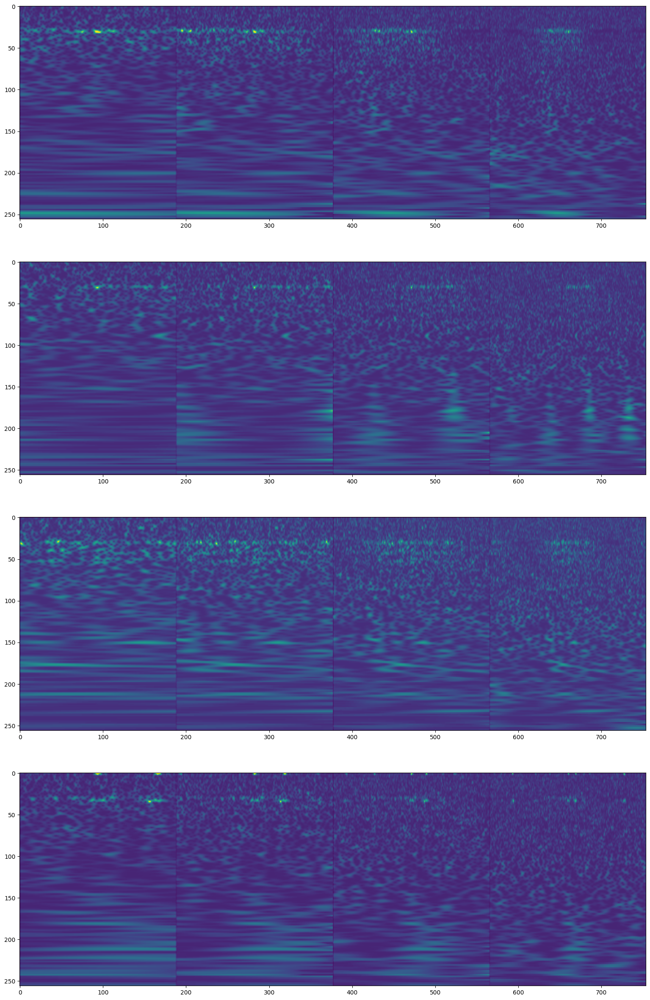

In [31]:
fig, ax = plt.subplots(nrows=4, figsize=(50,30))
for idx, img in enumerate(batch_valid[0][:4]):
    ax[idx].imshow(img)
    #ax[idx].title.set_text(batch_train)

# new test iamges...

In [41]:
dataTe = tf.keras.preprocessing.image_dataset_from_directory('/kaggle/working/Concat_Test_images',
                                                    labels = 'inferred',
                                                              label_mode = 'int',
                                                               color_mode ='grayscale',
                                                              batch_size = 32,
                                                               image_size=(256,754),
                                                             shuffle = False,
                                                             seed = 33
                                                    )

Found 1180 files belonging to 22 classes.


In [33]:
data_iterator_test = dataTe.as_numpy_iterator()

In [34]:
batch_test = data_iterator_test.next()
print(len(batch_test))


2


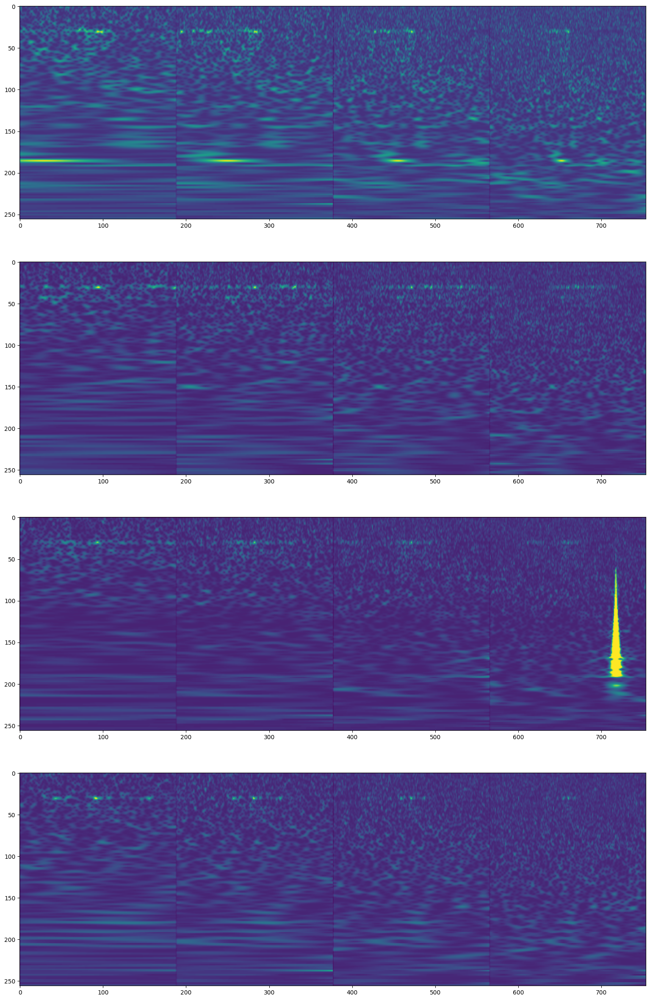

In [35]:
fig, ax = plt.subplots(nrows=4, figsize=(50,30))
for idx, img in enumerate(batch_test[0][:4]):
    ax[idx].imshow(img)
    #ax[idx].title.set_text(batch_train)

# scaling data ...

In [21]:
from sklearn.metrics import accuracy_score, confusion_matrix

import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import models, layers, optimizers
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

In [22]:
class_names = os.listdir('/kaggle/working/Concat_Train_images')
class_names.sort()
class_names

['1080Lines',
 '1400Ripples',
 'Air_Compressor',
 'Blip',
 'Chirp',
 'Extremely_Loud',
 'Helix',
 'Koi_Fish',
 'Light_Modulation',
 'Low_Frequency_Burst',
 'Low_Frequency_Lines',
 'No_Glitch',
 'None_of_the_Above',
 'Paired_Doves',
 'Power_Line',
 'Repeating_Blips',
 'Scattered_Light',
 'Scratchy',
 'Tomte',
 'Violin_Mode',
 'Wandering_Line',
 'Whistle']

# train

In [ ]:

data1 = train_gen.flow_from_directory('/kaggle/working/Concat_Train_images',
                                                              
                                                              label_mode = 'int',
                                                              color_mode ='grayscale',
                                                              batch_size = 128,
                                                              image_size=(256,1024),
                                                              shuffle = False,
                                                              seed=33)


In [ ]:
data1 = dataTr.map(lambda x,y: (x/255, y))


# validation 

In [ ]:
'''
data2 = valid_gen.flow_from_directory('/kaggle/working/Concat_Valid_images',
                                                    labels = 'inferred',
                                                              label_mode = 'int',
                                                               color_mode ='grayscale',
                                                              batch_size = 128,
                                                               image_size=(256,1024),
                                                             shuffle = False,
                                                     seed = 33)
                                                    
'''

In [ ]:
#data2.as_numpy_iterator().next()

In [ ]:
data2= dataVa.map(lambda x,y: (x/255, y))

# test

In [ ]:
data3 = dataTe.map(lambda x,y: (x/255, y))

In [ ]:
data3.as_numpy_iterator().next()

# MODEL making ...****

In [ ]:

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout

In [24]:
tf.debugging.set_log_device_placement(True)

In [25]:
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()  # TPU detection
    tf.config.experimental_connect_to_cluster(tpu)  # Connect to the TPU cluster
    tf.config.experimental.set_memory_growth(tpu, True)
    tf.keras.backend.set_session(tf.Session())
except ValueError:
    tpu = None

# Create a strategy
strategy = tf.distribute.TPUStrategy(tpu) if tpu else tf.distribute.MirroredStrategy()

print('Number of replicas:', strategy.num_replicas_in_sync)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:CPU:0',)
Number of replicas: 1


In [ ]:
with strategy.scope():
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(128, (5, 5),1, activation='relu',padding='same', input_shape=(94,114,1)),
        tf.keras.layers.MaxPooling2D((2, 2)),
        
        tf.keras.layers.Conv2D(128, (5,5), 1, activation='relu'),
        tf.keras.layers.MaxPooling2D(2,2),
        
        #tf.keras.layers.Conv2D(128, (5,5), 1, activation='relu'),
       # tf.keras.layers.MaxPooling2D(2,2),
        
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dropout(0.25),
        tf.keras.layers.Dense(22, activation="softmax")
        
    ])
    
    
    #optimizer = Adam(learning_rate=0.001)

    model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    model.summary()

In [25]:
logdir='logs'

In [26]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=logdir)


In [43]:
#es = EarlyStopping(monitor='val_loss',mode='min',patience=3,verbose=1)
#RLr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience = 2, verbose = 1, min_delta=1e-3,min_lr=1e-6)

In [ ]:
history1 = model.fit(data1,
                    epochs=10,
                    validation_data=data2,shuffle = False,verbose =1,callbacks=[tensorboard_callback])

# Model 2

In [27]:
batch_size = 128

In [29]:

train_gen = ImageDataGenerator(rescale = 1./255.,
                           samplewise_center=True,
                           samplewise_std_normalization=True)

valid_gen =  ImageDataGenerator(rescale = 1./255.,
                           samplewise_center=True,
                           samplewise_std_normalization=True)

test_gen =  ImageDataGenerator(rescale = 1./255.,
                           samplewise_center=True,
                           samplewise_std_normalization=True)


In [ ]:
tr_data = train_gen.flow_from_directory('/kaggle/working/Concat_Train_images',
                                  batch_size=batch_size,
                                  classes=class_names,
                                  color_mode= 'grayscale',
                                  class_mode='categorical',
                                  shuffle=False,
                                  target_size=(94,114),
                                  seed= 42)


In [ ]:
va_data = valid_gen.flow_from_directory('/kaggle/working/Concat_Valid_images',
                                  batch_size=batch_size,
                                  classes=class_names,
                                  color_mode ='grayscale',
                                  class_mode='categorical',
                                  shuffle=False,
                                  target_size=(94,114),
                                  seed= 42)

In [ ]:
te_data = test_gen.flow_from_directory('/kaggle/working/Concat_Test_images',
                                  batch_size=batch_size,
                                  classes=class_names,
                                  color_mode= 'grayscale',
                                  class_mode='categorical',
                                  shuffle=False,
                                  target_size=(94,114),
                                  seed= 42)

In [ ]:
print(tr_data.n)

In [ ]:
with strategy.scope():
    model2 = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(128,5,1, activation='relu',padding='same', 
                               data_format='channels_last',input_shape=(94,114,1)),
        tf.keras.layers.MaxPooling2D((2, 2)),
        
        tf.keras.layers.Conv2D(128, 5, 1, activation='relu'),
        tf.keras.layers.MaxPooling2D(2,2),
        
        #tf.keras.layers.Conv2D(128, (5,5), 1, activation='relu'),
       # tf.keras.layers.MaxPooling2D(2,2),
        
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dropout(0.25),
        tf.keras.layers.Dense(22, activation="softmax")
        
    ])
    
    
    #optimizer = Adam(learning_rate=0.001)

    model2.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    model2.summary()

In [ ]:
history2 = model2.fit(tr_data,
                    epochs=20,
                    steps_per_epoch=int(tr_data.n/batch_size),
                    validation_steps=int(va_data.n/batch_size),
                    validation_data=va_data,shuffle = False,verbose =1,callbacks=[es,RLr])

# model 3..

In [30]:
tr_data2 = train_gen.flow_from_directory('/kaggle/working/Concat_Train_images',
                                  batch_size=batch_size,
                                  classes=class_names,
                                  color_mode= 'grayscale',
                                  class_mode='categorical',
                                  shuffle=True,
                                  target_size=(256,754),
                                  seed=1)

Found 5587 images belonging to 22 classes.


In [31]:
va_data2 = valid_gen.flow_from_directory('/kaggle/working/Concat_Valid_images',
                                  batch_size=batch_size,
                                  classes=class_names,
                                  color_mode ='grayscale',
                                  class_mode='categorical',
                                  shuffle=True,
                                  target_size=(256,754),
                                  seed= 1)

Found 1200 images belonging to 22 classes.


In [32]:
te_data2 = test_gen.flow_from_directory('/kaggle/working/Concat_Test_images',
                                  batch_size=batch_size,
                                  classes=class_names,
                                  color_mode= 'grayscale',
                                  class_mode='categorical',
                                  shuffle=False,
                                  target_size=(256,754),
                                  seed= 42)

Found 1180 images belonging to 22 classes.


In [43]:
'''
# Applying caching, batching, and prefetching

batch_size = 128

train_data1 = (
    dataTr
    .cache()  # Cache data in memory after the first epoch
    .batch(batch_size)  # Batch the data
    .prefetch(buffer_size=tf.data.AUTOTUNE)  # Prefetch to improve performance
)

##
valid_data1 = (
    dataVa
    .cache()  # Cache data in memory after the first epoch
    .batch(batch_size)  # Batch the data
    .prefetch(buffer_size=tf.data.AUTOTUNE)  # Prefetch to improve performance
)

##
test_data1 = (
    dataTe
    .cache()  # Cache data in memory after the first epoch
    .batch(batch_size)  # Batch the data
    .prefetch(buffer_size=tf.data.AUTOTUNE)  # Prefetch to improve performance
)
'''

In [33]:
with strategy.scope():
    model3 = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(128,5,2, activation='relu',padding='same', 
                               data_format='channels_last',input_shape=(256,754,1)),
        tf.keras.layers.MaxPooling2D(2, 2),
        
        tf.keras.layers.Conv2D(128, 5, 2, activation='relu'),
        tf.keras.layers.MaxPooling2D(2,2),
        
        #tf.keras.layers.Conv2D(128, (5,5), 1, activation='relu'),
       # tf.keras.layers.MaxPooling2D(2,2),
        
        tf.keras.layers.Flatten(),
        #tf.keras.layers.Dropout(0.25),
        tf.keras.layers.Dense(22, activation="softmax")
        
    ])
    
    
    #optimizer = Adam(learning_rate=0.001)

    model3.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    model3.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 128, 377, 128)  │         3,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 188, 128)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 30, 92, 128)    │       409,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 15, 46, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 88320)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 22)             │     1,943,062 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,356,118 (8.99 MB)

 Trainable params: 2,356,118 (8.99 MB)

 Non-trainable params: 0 (0.00 B)

In [34]:
history3 = model3.fit(tr_data2,
                    epochs=15,
                    #steps_per_epoch=int(tr_data2.n/batch_size),
                    #validation_steps=int(va_data2.n/batch_size),
                    validation_data=va_data2,shuffle = False,verbose =1,callbacks=[tensorboard_callback])

Epoch 1/15
44/44 ━━━━━━━━━━━━━━━━━━━━ 193s 4s/step - accuracy: 0.4942 - loss: 2.4678 - val_accuracy: 0.9025 - val_loss: 0.3711
Epoch 2/15
44/44 ━━━━━━━━━━━━━━━━━━━━ 190s 4s/step - accuracy: 0.9280 - loss: 0.2479 - val_accuracy: 0.9392 - val_loss: 0.2356
Epoch 3/15
44/44 ━━━━━━━━━━━━━━━━━━━━ 190s 4s/step - accuracy: 0.9681 - loss: 0.1038 - val_accuracy: 0.9333 - val_loss: 0.2484
Epoch 4/15
44/44 ━━━━━━━━━━━━━━━━━━━━ 190s 4s/step - accuracy: 0.9854 - loss: 0.0564 - val_accuracy: 0.9275 - val_loss: 0.2940
Epoch 5/15
44/44 ━━━━━━━━━━━━━━━━━━━━ 191s 4s/step - accuracy: 0.9865 - loss: 0.0430 - val_accuracy: 0.9300 - val_loss: 0.2986
Epoch 6/15
44/44 ━━━━━━━━━━━━━━━━━━━━ 190s 4s/step - accuracy: 0.9881 - loss: 0.0353 - val_accuracy: 0.9333 - val_loss: 0.3256
Epoch 7/15
44/44 ━━━━━━━━━━━━━━━━━━━━ 190s 4s/step - accuracy: 0.9912 - loss: 0.0349 - val_accuracy: 0.9350 - val_loss: 0.3287
Epoch 8/15
44/44 ━━━━━━━━━━━━━━━━━━━━ 191s 4s/step - accuracy: 0.9944 - loss: 0.0218 - val_accuracy: 0.9392 - v

# Model accuracy and loss

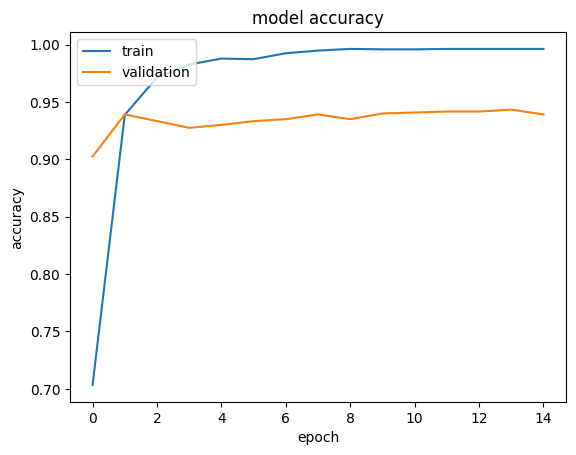

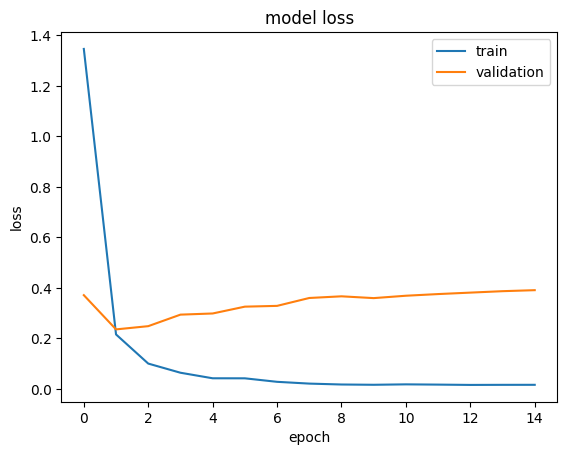

In [35]:
plt.plot(history3.history['accuracy'])
plt.plot(history3.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()


# summarize history for loss
plt.plot(history3.history['loss'])
plt.plot(history3.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

# Predictions on test dataset...

In [36]:
from sklearn.metrics import classification_report

In [37]:
Y_pred = model3.predict(te_data2,steps = 4720, verbose = 1)
Y_pred = np.argmax(Y_pred, axis=1)
Y_ts = te_data2.classes

4720/4720 ━━━━━━━━━━━━━━━━━━━━ 13s 2ms/step   


In [38]:
accuracy = accuracy_score(Y_ts, Y_pred)
accuracy

0.940677966101695

In [39]:
print(classification_report(Y_ts, Y_pred, target_names=te_data2.class_indices.keys()))


                     precision    recall  f1-score   support

          1080Lines       0.98      0.96      0.97        50
        1400Ripples       0.90      1.00      0.95         9
     Air_Compressor       1.00      0.89      0.94         9
               Blip       0.98      0.98      0.98       273
              Chirp       1.00      1.00      1.00        10
     Extremely_Loud       0.90      0.94      0.92        64
              Helix       0.95      0.95      0.95        42
           Koi_Fish       0.96      0.98      0.97       102
   Light_Modulation       0.94      0.94      0.94        78
Low_Frequency_Burst       0.89      0.93      0.91        90
Low_Frequency_Lines       0.91      0.89      0.90        66
          No_Glitch       0.78      0.67      0.72        21
  None_of_the_Above       0.50      0.55      0.52        11
       Paired_Doves       0.25      0.25      0.25         4
         Power_Line       1.00      0.99      0.99        68
    Repeating_Blips    

In [40]:
import seaborn as sns

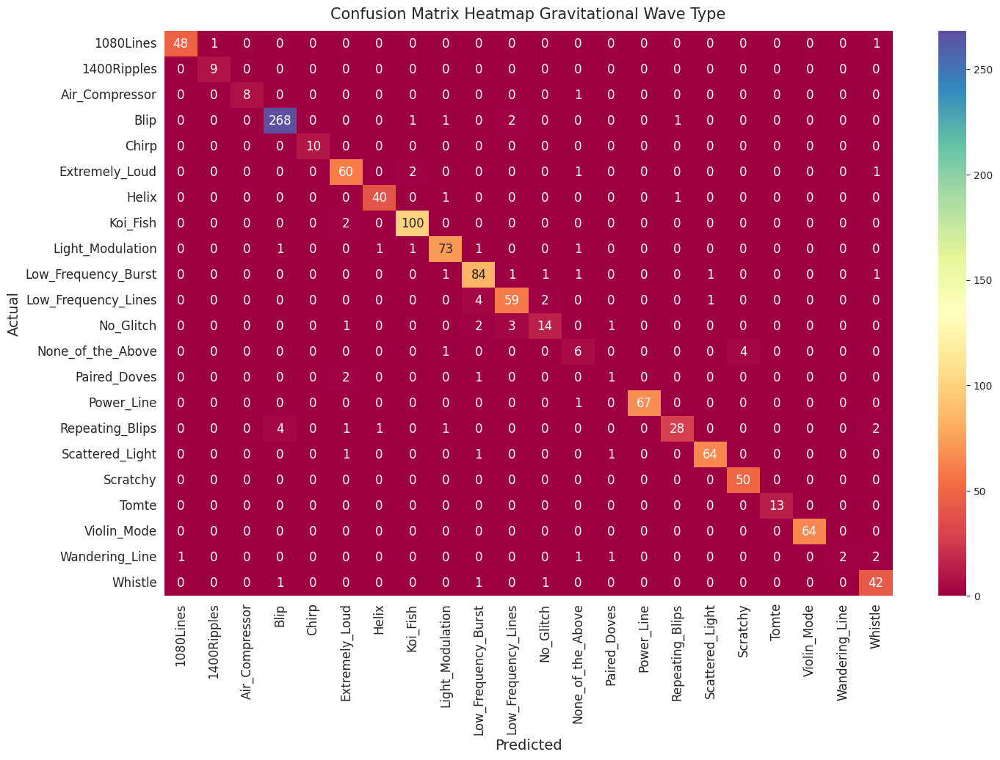

-Accuracy achieved: 94.07%
-Accuracy by model: 99.62%
-Accuracy by validation: 93.92%


In [41]:
confu_mat = confusion_matrix(Y_ts,Y_pred)
sns.set_style(style='white')
plt.figure(figsize=(16,10))
heatmap = sns.heatmap(confu_mat,vmin=np.min(confu_mat.all()), vmax=np.max(confu_mat), annot=True,fmt='d', 
                      annot_kws={"fontsize":12},cmap='Spectral')
heatmap.set_title('Confusion Matrix Heatmap Gravitational Wave Type', fontdict={'fontsize':15}, pad=12)
heatmap.set_xlabel('Predicted',fontdict={'fontsize':14})
heatmap.set_ylabel('Actual',fontdict={'fontsize':14})
heatmap.set_xticklabels(class_names, fontdict={'fontsize':12,'rotation': 90})
heatmap.set_yticklabels(class_names, fontdict={'fontsize':12,'rotation': 0})
plt.show()

print('-Accuracy achieved: {:.2f}%\n-Accuracy by model: {:.2f}%\n-Accuracy by validation: {:.2f}%'.
      format(accuracy_score(Y_ts,Y_pred)*100,(history3.history['accuracy'][-1])*100,
             (history3.history['val_accuracy'][-1])*100))

# Saving the finest model....

In [44]:
from keras.models import load_model

model3.save('Gravity_spy_model_1_success.h5')

# For app deployment ...code below

In [45]:
import pickle


In [59]:
with open('model_pickle','wb') as f:
    pickle.dump(model3,f)
    #pickle_out.close()

# Transfer learning implementation...on above best model...

In [28]:
from tensorflow.keras.layers import Input, Lambda, Dense, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
import numpy as np
from glob import glob
import matplotlib.pyplot as plt

In [47]:
# re-size all the images to this
IMAGE_SIZE = [224, 224,3]

train_path = '/kaggle/working/Concat_Train_images'
valid_path = '/kaggle/working/Concat_Valid_images'



In [30]:
 # useful for getting number of classes
folders = glob('/kaggle/working/Concat_Train_images/*')
print(len(folders))

22


In [48]:

# add preprocessing layer to the front of VGG
vgg_model = VGG16(input_shape=IMAGE_SIZE, weights='imagenet', include_top=False)

# don't train existing weights
#for layer in vgg_model.layers:
  #layer.trainable = False

vgg_model.trainable = False

#x = vgg_model.output
#x = GlobalAveragePooling2D()(x)
#x = Dense(1024, activation='relu')(x)
#predictions = Dense(train_generator.num_classes, activation='softmax')(x)
# our layers - you can add more if you want

x = Flatten()(vgg_model.output)

prediction = Dense(len(folders), activation='softmax')(x)

model4 = Model(inputs=vgg_model.input, outputs=prediction)



# view the structure of the model
model4.summary()



Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 22)             │       551,958 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,266,646 (58.24 MB)

 Trainable params: 551,958 (2.11 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [122]:
# tell the model what cost and optimization method to use
model4.compile(
  loss='sparse_categorical_crossentropy',
  optimizer='adam',
  metrics=['accuracy'])

In [52]:
train_genz = ImageDataGenerator(rescale = 1./255.,
                           samplewise_center=True,
                           samplewise_std_normalization=True)

valid_genz =  ImageDataGenerator(rescale = 1./255.,
                           samplewise_center=True,
                           samplewise_std_normalization=True)

test_genz =  ImageDataGenerator(rescale = 1./255.,
                           samplewise_center=True,
                           samplewise_std_normalization=True)

In [95]:
def augment_image(image, label):
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    image = tf.image.random_brightness(image, max_delta=0.3)
    image = tf.image.random_contrast(image, lower=0.7, upper=1.3)
    image = tf.image.random_hue(image, max_delta=0.05)
    image = tf.image.random_saturation(image, lower=0.7, upper=1.3)
    image = tf.image.resize(image, [224, 224])
    return image, label

In [96]:
def load_and_preprocess_image1(path, label):
    image = tf.io.read_file(path)
    image = tf.image.decode_png(image, channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)  # Normalize to [0, 1]
    image = augment_image(image)
    return image, label

In [97]:
def scale(image,label):
    
    return image/255 , label

In [ ]:
#Train1 = tf.data.Dataset.from_tensor_slices((image_paths, labels))
Train1 = Train1map(load_and_preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
Train1 = Train1.cache()  # Cache in memory after preprocessing
Train1 = Train1.shuffle(buffer_size=1000)  # Shuffle the dataset
Train1 = Train1.batch(32)  # Batch size
Train1 = Train1.prefetch(buffer_size=tf.data.AUTOTUNE)

In [101]:
dataTr1 = tf.keras.preprocessing.image_dataset_from_directory('/kaggle/working/Concat_Train_images',
                                                              labels = 'inferred',
                                                              label_mode = 'int',
                                                              color_mode ='rgb',
                                                              batch_size = None,
                                                              image_size=(224,224),
                                                              shuffle = False,
                                                              seed=33
                                                    )

Found 5587 files belonging to 22 classes.


In [102]:
for batch in dataTr1.take(4):
    print(batch)
    break

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[13.785715 , 13.785715 , 13.785715 ],
        [16.62245  , 16.62245  , 16.62245  ],
        [28.505104 , 28.505104 , 28.505104 ],
        ...,
        [14.3519945, 14.3519945, 14.3519945],
        [17.025614 , 17.025614 , 17.025614 ],
        [15.321743 , 15.321743 , 15.321743 ]],

       [[31.67347  , 31.67347  , 31.67347  ],
        [32.413265 , 32.413265 , 32.413265 ],
        [61.86735  , 61.86735  , 61.86735  ],
        ...,
        [33.254997 , 33.254997 , 33.254997 ],
        [36.479614 , 36.479614 , 36.479614 ],
        [34.526264 , 34.526264 , 34.526264 ]],

       [[32.57143  , 32.57143  , 32.57143  ],
        [30.229591 , 30.229591 , 30.229591 ],
        [51.4847   , 51.4847   , 51.4847   ],
        ...,
        [35.70896  , 35.70896  , 35.70896  ],
        [41.33148  , 41.33148  , 41.33148  ],
        [36.49557  , 36.49557  , 36.49557  ]],

       ...,

       [[30.       , 30.       , 30.       ],
        [30.

In [104]:
dataset1 = dataTr1.map(augment_image,num_parallel_calls=tf.data.AUTOTUNE)

In [105]:
dataset1 = dataset1.map(scale)

In [106]:
# Cache the dataset to improve performance (optional)
dataset1 = dataset1.cache()

# Shuffle the dataset
dataset1 = dataset1.shuffle(buffer_size=1000)  # Adjust buffer_size as needed

# Batch the dataset
dataset1 = dataset1.batch(batch_size=32)  # Adjust batch_size as needed

# Prefetch to overlap data preprocessing with model training
dataset1 = dataset1.prefetch(buffer_size=tf.data.AUTOTUNE)

In [ ]:
for batch in dataset1.batch(1):
    print(batch.shape)
    break

In [107]:
dataVa1 = tf.keras.preprocessing.image_dataset_from_directory('/kaggle/working/Concat_Valid_images',
                                                    labels = 'inferred',
                                                              label_mode = 'int',
                                                               color_mode ='rgb',
                                                              batch_size =None,
                                                               image_size=(224,224),
                                                             shuffle = False,
                                                     seed = 33
                                                    )

Found 1200 files belonging to 22 classes.


In [108]:
dataset2 = dataVa1.map(augment_image,num_parallel_calls=tf.data.AUTOTUNE)

In [109]:
dataset2 = dataset2.map(scale)

In [110]:
# Cache the dataset to improve performance (optional)
dataset2 = dataset2.cache()

# Shuffle the dataset
dataset2 = dataset2.shuffle(buffer_size=1000)  # Adjust buffer_size as needed

# Batch the dataset
dataset2= dataset2.batch(batch_size=32)  # Adjust batch_size as needed

# Prefetch to overlap data preprocessing with model training
dataset2 = dataset2.prefetch(buffer_size=tf.data.AUTOTUNE)

In [118]:
 dataTe1 = tf.keras.preprocessing.image_dataset_from_directory('/kaggle/working/Concat_Test_images',
                                                    labels = 'inferred',
                                                              label_mode = 'int',
                                                               color_mode ='rgb',
                                                              batch_size = None,
                                                               image_size=(224,224),
                                                             shuffle = False,
                                                             seed = 33
                                                    )

Found 1180 files belonging to 22 classes.


In [119]:
dataset3 = dataTe1.map(augment_image,num_parallel_calls=tf.data.AUTOTUNE)
dataset3 = dataset3.map(scale)

In [120]:
# Cache the dataset to improve performance (optional)
dataset3 = dataset3.cache()

# Shuffle the dataset
dataset3 = dataset3.shuffle(buffer_size=1000)  # Adjust buffer_size as needed

# Batch the dataset
dataset3= dataset3.batch(batch_size=32)  # Adjust batch_size as needed

# Prefetch to overlap data preprocessing with model training
dataset3 = dataset3.prefetch(buffer_size=tf.data.AUTOTUNE)

In [53]:
tr_data3 = train_genz.flow_from_directory('/kaggle/working/Concat_Train_images',
                                  batch_size=32,
                                  classes=class_names,
                                  color_mode= 'rgb',
                                  class_mode='categorical',
                                  shuffle=True,
                                  target_size=(224,224),
                                  seed=11)

Found 5587 images belonging to 22 classes.


In [54]:
va_data3 = valid_genz.flow_from_directory('/kaggle/working/Concat_Valid_images',
                                  batch_size=32,
                                  classes=class_names,
                                  color_mode ='rgb',
                                  class_mode='categorical',
                                  shuffle=True,
                                  target_size=(224,224),
                                  seed= 11)

Found 1200 images belonging to 22 classes.


In [55]:
te_data3 = test_genz.flow_from_directory('/kaggle/working/Concat_Test_images',
                                  batch_size=32,
                                  classes=class_names,
                                  color_mode= 'rgb',
                                  class_mode='categorical',
                                  shuffle=False,
                                  target_size=(224,224),
                                  seed= 11)

Found 1180 images belonging to 22 classes.


In [73]:
len(dataTr1)

44

In [66]:
#data cache and prefetch using instead of image generator...

tf_training = tf.data.Dataset.list_files("/kaggle/working/Concat_Train_images/*/*",shuffle = False)
tf_training

<_TensorSliceDataset element_spec=TensorSpec(shape=(), dtype=tf.string, name=None)>

In [67]:

for f in tf_training.take(4):
  print(f.numpy())

b'/kaggle/working/Concat_Train_images/1080Lines/H1_08UZkPPyFQ_spectrogram_4.0.png_concatenated.png'
b'/kaggle/working/Concat_Train_images/1080Lines/H1_0GvkzNqHsg_spectrogram_4.0.png_concatenated.png'
b'/kaggle/working/Concat_Train_images/1080Lines/H1_0HjYyme9E8_spectrogram_4.0.png_concatenated.png'
b'/kaggle/working/Concat_Train_images/1080Lines/H1_1HqI1M9e7Y_spectrogram_4.0.png_concatenated.png'


In [123]:
Trans_learn_model = model4.fit(
                          dataset1,
                          validation_data=dataset2,
                          epochs=5)
                          #steps_per_epoch=len(tr_data3),
                          #validation_steps=len(va_data3))

Epoch 1/5
175/175 ━━━━━━━━━━━━━━━━━━━━ 2035s 12s/step - accuracy: 0.6355 - loss: 1.9256 - val_accuracy: 0.7042 - val_loss: 1.3145
Epoch 2/5
175/175 ━━━━━━━━━━━━━━━━━━━━ 1996s 11s/step - accuracy: 0.7969 - loss: 0.8945 - val_accuracy: 0.7000 - val_loss: 1.2644
Epoch 3/5
175/175 ━━━━━━━━━━━━━━━━━━━━ 1989s 11s/step - accuracy: 0.8152 - loss: 0.8633 - val_accuracy: 0.7158 - val_loss: 1.3630
Epoch 4/5
175/175 ━━━━━━━━━━━━━━━━━━━━ 1997s 11s/step - accuracy: 0.8426 - loss: 0.8016 - val_accuracy: 0.8325 - val_loss: 0.7082
Epoch 5/5
175/175 ━━━━━━━━━━━━━━━━━━━━ 2002s 11s/step - accuracy: 0.8961 - loss: 0.4134 - val_accuracy: 0.7833 - val_loss: 0.7788


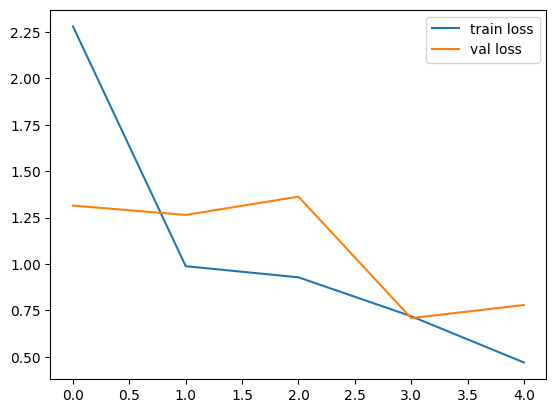

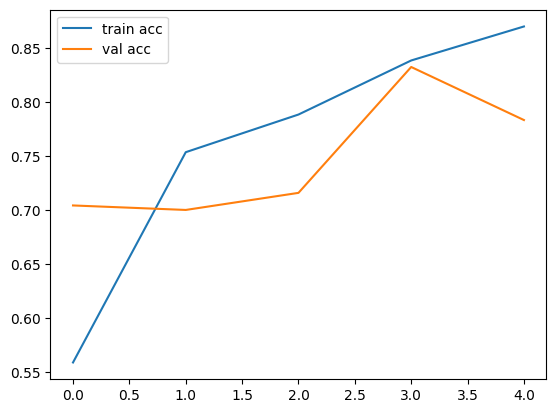

<Figure size 640x480 with 0 Axes>

In [126]:
# loss
plt.plot(Trans_learn_model.history['loss'], label='train loss')
plt.plot(Trans_learn_model.history['val_loss'], label='val loss')
plt.legend()
plt.show()
plt.savefig('LossVal_loss')

# accuracies
plt.plot(Trans_learn_model.history['accuracy'], label='train acc')
plt.plot(Trans_learn_model.history['val_accuracy'], label='val acc')
plt.legend()
plt.show()
plt.savefig('AccVal_acc')

In [127]:
Y_pred_trans = model4.predict(dataset3,steps = 4720, verbose = 1)
Y_pred_trains = np.argmax(Y_pred_trans, axis=1)
Y_ts_trans = dataTe1.classes

  15/4720 ━━━━━━━━━━━━━━━━━━━━ 12:11:55 9s/step

KeyboardInterrupt: 

In [ ]:
accuracy_trans = accuracy_score(Y_ts_trans,Y_pred_trans)
accuracy_trans

In [ ]:
print(classification_report(Y_ts_trans, Y_pred_trans, target_names=dataTe1.class_indices.keys()))


In [128]:
from keras.models import load_model

model4.save('Gravity_spy_model_1_transLearning.h5')


#With image data generator ...for same above model4..

In [129]:
with strategy.scope():
    base_model = vgg_model2 = VGG16(input_shape=IMAGE_SIZE,
                                    weights='imagenet',
                                    include_top=False)

    base_model.trainable = False  # Freeze the base model

    
    x = Flatten()(vgg_model.output)

    prediction = Dense(len(folders), activation='softmax')(x)

    model5 = Model(inputs=vgg_model.input, outputs=prediction)



    # view the structure of the model
    model5.summary()
    
'''
    model = tf.keras.Sequential([
        base_model,
        tf.keras.layers.GlobalAveragePooling2D(),
        tf.keras.layers.Dense(10, activation='softmax')  # Adjust the number of classes
    ])
    
'''

NameError: name 'strategy' is not defined

In [ ]:
model5.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

# Fine Tuning for the Transfer Learning...

In [ ]:
vgg_model2 = VGG16(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)

In [ ]:
vgg_model2.trainable = True

set_trainable = False

for layer in vgg_model2.layers:
  if layer.name == 'block5_conv1':
    set_trainable = True
  if set_trainable:
    layer.trainable = True
  else:
    layer.trainable = False

for layer in vgg_model2.layers:
  print(layer.name,layer.trainable)

In [ ]:
vgg_model2.summary()

In [ ]:
Ultra_model = Sequential()

Ultra_model.add(vgg_model2)
Ultra_model.add(Flatten())
#Ultra_model.add(Dense(256,activation='relu'))
Ultra_model.add(Dense(22,activation='sigmoid'))

In [ ]:
Ultra_model.compile(
    optimizer=keras.optimizers.RMSprop(lr=1e-5),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy'])

In [ ]:
history = model.fit(dataset1,epochs=5,validation_data=dataset2,verbose=1)